# **Title : A Generative Approach to 3D Reconstruction from Text Data**





# **Final-Phase: Implementation of Text to 3D reconstuction Pipeline**

1. Text to Image Generation With Evaluation
2. Reflection Removal and Enhance the image using Reinforcement Learning agent
3. StableDelight: Revealing Hidden Textures by Removing Specular Reflections
4. Upscale the image using GAN
2. Generated Image to 3D Reconstuction of Single object

          
          
               
            Duration: 16/11/24 - 02/03/25

# **Block Diagram**
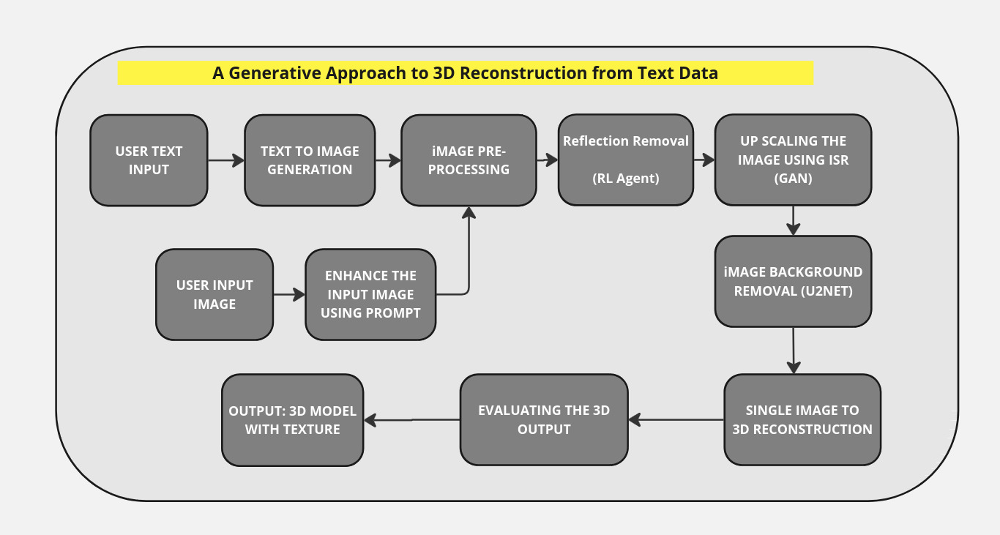

A Generative Approach to 3D Reconstruction from Text Data, outlining the process of transforming text or image inputs into a textured 3D model. The process begins with user text input, which is converted into an image through text-to-image generation. This image undergoes preprocessing, including reflection removal using a reinforcement learning (RL) agent. Next, the image is upscaled using ISR (GAN) and processed for background removal with U2NET before proceeding to single-image 3D reconstruction. Alternatively, users can provide their own images, which can be enhanced using prompts before being integrated into the pipeline. The reconstructed 3D model is then evaluated, resulting in the final textured 3D output.

# **GPU Check**

In [ ]:
!nvidia-smi

Sun Feb 16 13:51:33 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# **Import all necessary files in GDrive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/3dreconstruction/Image_3DReconstruction

/content/drive/MyDrive/3dreconstruction/Image_3DReconstruction


In [ ]:
!ls

app.py		       input-lineart   output-TripoSR		 README.md	   SD_Out
config.json	       input-TripoSR   Pencil_ColorGenerator.py  requirements.txt  tsr
drawing-to-3d-example  output-LineArt  PromptsExamples.txt	 RunTripoSR.py


# **Install necessary library**

In [ ]:
!pip install -r requirements.txt

  Cloning https://github.com/tatsy/torchmcubes.git to /tmp/pip-req-build-wom2bxz1
  Running command git clone --filter=blob:none --quiet https://github.com/tatsy/torchmcubes.git /tmp/pip-req-build-wom2bxz1
  Resolved https://github.com/tatsy/torchmcubes.git to commit 3381600ddc3d2e4d74222f8495866be5fafbace4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.1/123.1 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of tokenizers to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of tokenizers to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might

In [ ]:
!pip install peft==0.6.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.7/174.7 kB 14.8 MB/s eta 0:00:00
  Attempting uninstall: peft
    Found existing installation: peft 0.14.0
    Uninstalling peft-0.14.0:
      Successfully uninstalled peft-0.14.0


In [ ]:
!pip uninstall diffusers
!pip install diffusers

Found existing installation: diffusers 0.23.1
Uninstalling diffusers-0.23.1:
  Would remove:
    /usr/local/bin/diffusers-cli
    /usr/local/lib/python3.11/dist-packages/diffusers-0.23.1.dist-info/*
    /usr/local/lib/python3.11/dist-packages/diffusers/*
Proceed (Y/n)? y
  Successfully uninstalled diffusers-0.23.1
  Using cached diffusers-0.32.2-py3-none-any.whl.metadata (18 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 464.1/464.1 kB 31.9 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.17.3
    Uninstalling huggingface-hub-0.17.3:
      Successfully uninstalled huggingface-hub-0.17.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tokenizers 0.14.1 requires huggingface_hub<0.18,>=0.16.4, but you have huggingface-hub 0.28.1 

In [ ]:
!pip install onnxruntime torch-fidelity scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.5 MB/s eta 0:00:00


In [ ]:
!pip install gradio==4.44.1

  Using cached gradio-4.44.1-py3-none-any.whl.metadata (15 kB)
  Using cached gradio_client-1.3.0-py3-none-any.whl.metadata (7.1 kB)
  Using cached ruff-0.8.3-py3-none-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (25 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.7/318.7 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 46.2 MB/s eta 0:00:00
  Attempting uninstall: gradio-client
    Found existing installation: gradio_client 0.7.1
    Uninstalling gradio_client-0.7.1:
      Successfully uninstalled gradio_client-0.7.1
  Attempting uninstall: gradio
    Found existing installation: gradio 4.8.0
    Uninstalling gradio-4.8.0:
      Successfully uninstalled gradio-4.8.0


In [ ]:
!pip install transformers --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 36.5 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.14.1
    Uninstalling tokenizers-0.14.1:
      Successfully uninstalled tokenizers-0.14.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.35.0
    Uninstalling transformers-4.35.0:
      Successfully uninstalled transformers-4.35.0


# **1. Text to Image Generation using stable diffusion**




**What is Stable Diffusion?**

Stable Diffusion, introduced in 2022, is a groundbreaking model designed to generate images from text descriptions. This innovative approach employs diffusion techniques to create visually appealing images based on textual prompts. Beyond image generation, Stable Diffusion is versatile enough for tasks like inpainting (filling in missing parts of an image), outpainting (extending an image beyond its original borders), and image-to-image translation using text prompts.

**How Does It Work?**

Diffusion models are generative models trained to progressively denoise an object, such as an image, to produce a meaningful sample. These models start with an image full of random pixels and noise, then iteratively refine it by reducing the noise at each step. This gradual denoising process eventually results in an image that aligns with the given prompt.

**Architecture of Stable Diffusion**

Stable Diffusion is built upon a diffusion model called Latent Diffusion, which is highly effective for tasks like text-to-image generation, image painting, and style transfer. Unlike traditional diffusion models that manipulate individual pixels, Latent Diffusion incorporates cross-attention layers into its architecture, enabling it to process and integrate information from text and other inputs.

<img src="https://blog.marvik.ai/wp-content/uploads/2023/11/an_intro_to_diffusion_models_img_16.png">

The architecture comprises three main components:

  Autoencoder:
        The autoencoder compresses the input image into a latent representation using its encoder.
        The decoder reconstructs the image from the latent representation.

  U-Net:
        U-Net is a type of convolutional neural network (CNN) that refines the latent representation of an image.
        It uses encoder-decoder blocks to progressively clean and enhance the image, reducing noise and improving quality.

  Text Encoder:
        The text encoder converts text prompts into latent representations using a transformer-based model (e.g., the Text Encoder from CLIP).
        It transforms input tokens into a sequence of latent text embeddings.



## **1.1. Import Necessary Library**

In [ ]:
from diffusers import StableDiffusionPipeline
import torch
import cv2
from google.colab.patches import cv2_imshow
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import numpy as np
from torch_fidelity import calculate_metrics


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

## **1.2. Pretrained Stable diffusion model**


In [ ]:
model_name = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_name)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker%2Fconfig.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
# Move the pipeline to GPU for faster inference
pipe.to("cuda")

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.32.2",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## **1.3. Stable diffusion: Postive and negative prompt**

Generating image...


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved to /content/Generated_image2.png


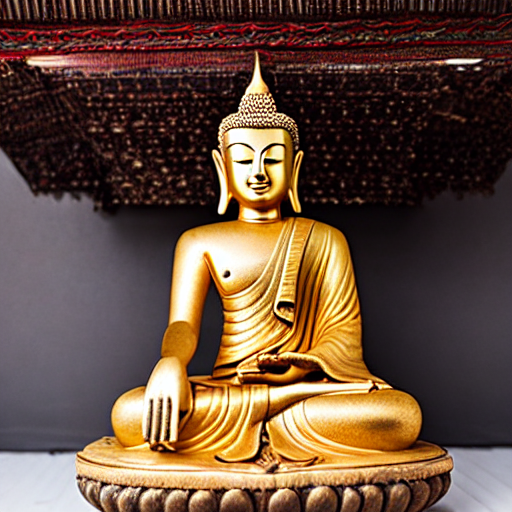

In [ ]:
# Define the positive and negative prompts
prompt = "wooden buddha with full statue and white background"

negative_prompt = (
    "poorly drawn, extra limbs, extra hands, extra feet, backwards limbs, extra fingers, "
    "extra toes, unrealistic, incorrect, bad anatomy, cut off body pieces, strange body positions, "
    "impossible body positioning, mismatched eyes, cross-eyed, crooked face, crooked lips, unclear, "
    "undefined, mutations, deformities, off center, poor_composition, duplicate faces, plastic, fake, "
    "tiny, negativity, blurry, blurred, doll, unclear"
)

#negative_prompt = ("poorly drawn, extra limbs, extra hands, extra feet, backwards limbs, extra fingers,extra toes, unrealistic, incorrect, bad anatomy, cut off body pieces, strange body positions,impossible body positioning, mismatched eyes, cross-eyed, crooked face, crooked lips, unclear,undefined, mutations, deformities, off center, poor_composition, duplicate faces, plastic, fake,tiny, negativity, blurry, blurred, doll, unclear")
#negative_prompt = "2D, Low Quality, text logos, watermarks, signatures, out of frame, jpeg artifacts, ((Multiple character)), (three hands), (Two body)ugly,poorly drawn, extra limbs,extra hands, extra feet ,backwards limbs ,extra fingers ,extra toes ,unrealistic, incorrect, bad anatomy ,cut off body pieces ,strange body positions ,impossible body positioning ,Mismatched eyes ,cross eyed ,crooked face ,crooked lips ,unclear ,undefined ,mutations ,deformities ,off center ,poor_composition ,duplicate faces, plastic, fake, tiny, negativity, blurry, blurred, doll, unclear"
# negative_prompt =  (
# "extra limbs, extra fingers, extra hands, bad anatomy, unnatural proportions, distorted, mismatched eyes, cross-eyed, blurred, plastic, fake, doll-like, uncanny valley, poor lighting, low resolution, flat shading, bad symmetry"
#  "extra legs, extra tails, bad anatomy, distorted, unrealistic fur, blurry details, poor composition, oversaturated, unnatural coloring, disfigured, plastic-like, fake, doll-like"
#  "distorted, blurry, noisy, low resolution, unrealistic texture, poor composition, warped, stretched, unnatural reflections, pixelated, watermarked, low detail"
#  "overexposed, underexposed, oversaturated, undersaturated, noisy, crowded, low resolution, blurred, unclear details, unnatural lighting, poor perspective, bad depth, pixelation, text artifacts"
# )

# Generate an image with the negative prompt
print("Generating image...")
generated_image = pipe(prompt=prompt, negative_prompt=negative_prompt).images[0]

# Save the image
output_path = "/content/Generated_image2.png"
generated_image.save(output_path)
print(f"Image saved to {output_path}")

# Display the image
image_cv = cv2.imread(output_path)
cv2_imshow(image_cv)


## **1.4. Evaluation Metrics of Text to Image Generation: CLIP Score**

The CLIP Score quantifies the semantic similarity between a generated image and a given text prompt. It is calculated as the cosine similarity between the text embedding (from the text prompt) and the image embedding (from the generated image). The score typically ranges between 0 and 1, where higher scores indicate better alignment between the image and text.

In [ ]:
# Load CLIP model and processor
clip_model_name = "openai/clip-vit-base-patch32"
clip_model = CLIPModel.from_pretrained(clip_model_name).to("cuda")
clip_processor = CLIPProcessor.from_pretrained(clip_model_name)

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
# Prepare image and text for CLIP evaluation
generated_image_pil = Image.open(output_path)
inputs = clip_processor(text=[prompt], images=generated_image_pil, return_tensors="pt", padding=True).to("cuda")

# Compute CLIP score
print("Computing CLIP score...")
outputs = clip_model(**inputs)
logits_per_image = outputs.logits_per_image  # Image-to-text similarity
clip_score = logits_per_image.softmax(dim=1).max().item()

print(f"CLIP Score: {clip_score:.4f}")

Computing CLIP score...
CLIP Score: 1.0000


# **2. Reflection Removal and Enhance the image using Reinforcement Learning agent**

## **Research Portion: Monte carlo with deep curve principle based Prediction (Brightness, smoothness, saturation, contrast, gamma, strength curve)**

 - Monte Carlo methods combined with the deep curve principle provide a robust approach to optimizing image enhancement parameters such as brightness, contrast, saturation, gamma, smoothness, and strength curves. Monte Carlo sampling generates multiple variations of these parameters, allowing the system to explore a wide range of possible enhancements. By evaluating these variations using statistical models, the best enhancement settings can be selected based on predefined quality metrics such as Structural Similarity Index (SSIM) and Mean Squared Error (MSE). This probabilistic approach ensures that the enhancement process is not limited to fixed values but adapts dynamically to different images and conditions.

- The deep curve principle leverages deep learning-based non-linear transformations to refine image enhancements further. Using Bezier curves, splines, and polynomial functions, the model learns complex relationships between input images and optimal enhancement parameters. These learned transformations allow for smooth, adaptive adjustments that improve visual quality while preserving image details. Unlike traditional enhancement techniques, which rely on manual tuning, deep curve-based models can generalize across diverse image datasets, providing consistent and high-quality outputs.

- Optimization plays a crucial role in fine-tuning the enhancement process. By integrating reinforcement learning or Bayesian optimization, the system continuously refines its predictions based on feedback from perceptual loss functions. This iterative learning approach ensures that enhancements are not only visually appealing but also aligned with human perception. Applications of this technique range from real-time video processing and medical imaging to computational photography and augmented reality, where automated and high-quality image enhancement is essential.


## **My RL agent implementation hasn’t been open-sourced yet.!**

## **2.1. RL agent output**

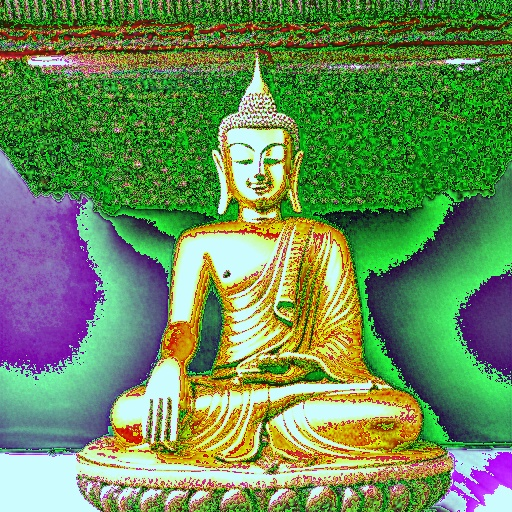

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Display the image
image_cv = cv2.imread(output_path)
cv2_imshow(image_cv)

# **3. Stable Delight: Revealing Hidden Textures by Removing Specular Reflections**

StableDelight is a cutting-edge solution for specular reflection removal from textured surfaces. Building upon the success of StableNormal, which focused on enhancing stability in monocular normal estimation, StableDelight takes this concept further by applying it to the challenging task of reflection removal. The training data include Hypersim, Lumos, and various Specular Highlight Removal datasets from TSHRNet. In addition, we've integrated a multi-scale SSIM loss and random conditional scales technique into our diffusion training process to improve sharpness in one-step diffusion prediction.

In [ ]:
!git clone https://github.com/Stable-X/StableDelight.git

Cloning into 'StableDelight'...
remote: Enumerating objects: 72, done.
remote: Counting objects: 100% (72/72), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 72 (delta 25), reused 39 (delta 4), pack-reused 0 (from 0)
Receiving objects: 100% (72/72), 36.76 KiB | 12.25 MiB/s, done.
Resolving deltas: 100% (25/25), done.
Error downloading object: files/image/cat.jpg (482abb7): Smudge error: Error downloading files/image/cat.jpg (482abb7f81ebf5ec76115e952de27b24d8ff4c127c4a23ddb2ab70f2bfb9bead): batch response: This repository is over its data quota. Account responsible for LFS bandwidth should purchase more data packs to restore access.

Errors logged to /content/StableDelight/.git/lfs/logs/20250216T143105.233920946.log
Use `git lfs logs last` to view the log.
error: external filter 'git-lfs filter-process' failed
fatal: files/image/cat.jpg: smudge filter lfs failed
You can inspect what was checked out with 'git status'
and retry with 'git restore --source=HEAD :/'



In [ ]:
%cd StableDelight

/content/StableDelight


In [ ]:
!pip install -r requirements.txt

  Using cached accelerate-0.30.1-py3-none-any.whl.metadata (18 kB)
  Using cached diffusers-0.28.0-py3-none-any.whl.metadata (19 kB)
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.2/162.2 kB 13.4 MB/s eta 0:00:00
  Using cached gradio-4.32.2-py3-none-any.whl.metadata (15 kB)
  Using cached gradio_client-0.17.0-py3-none-any.whl.metadata (7.1 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.5/108.5 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 917.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.8/126.8 kB 13.3 MB/s eta 0:00:00


In [ ]:
!pip install -e .

Obtaining file:///content
ERROR: file:///content does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [ ]:
!pip install --upgrade torch torchvision

  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.3.1.170-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Install necessary packages for StableDelight
!pip install --upgrade xformers[torch]
!pip install triton

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.4/43.4 MB 10.2 MB/s eta 0:00:00
  Attempting uninstall: xformers
    Found existing installation: xformers 0.0.24
    Uninstalling xformers-0.0.24:
      Successfully uninstalled xformers-0.0.24


In [ ]:
import os
import torch
from PIL import Image

# Load an image
input_image = Image.open("/content/Generated_image2.png")

# Create predictor instance with fallback options
try:
    import xformers  # Check if xformers is available
    predictor = torch.hub.load("Stable-X/StableDelight", "StableDelight_turbo", trust_repo=True)
    try:
        predictor.model.enable_xformers_memory_efficient_attention()  # Try enabling xformers attention
    except NotImplementedError:
        print("xFormers memory efficient attention not supported, falling back to Flash Attention or default.")
        try:
            from diffusers import FlashAttention
            predictor.model.set_attention_slice("auto")
        except ImportError:
            print("FlashAttention not found. Using default attention.")
except ImportError:
    print("xFormers not found. Using default StableDelight configuration.")
    predictor = torch.hub.load("Stable-X/StableDelight", "StableDelight_turbo", trust_repo=True)

# prediction
delight_image = predictor(input_image)

# Save or display the result
# ensure output directory exists
os.makedirs("output", exist_ok=True)
delight_image.save("delight.png")

Downloading: "https://github.com/Stable-X/StableDelight/zipball/master" to /root/.cache/torch/hub/master.zip
/usr/local/lib/python3.11/dist-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.11/dist-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.11/dist-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Col

model_index.json:   0%|          | 0.00/621 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/374 [00:00<?, ?B/s]

controlnet%2Fcontrolnetvae.py:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/574 [00:00<?, ?B/s]

controlnet%2Fconfig.json:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/728M [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/621 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/1.87k [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/681M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Keyword arguments {'trust_remote_code': True} are not expected by YosoDelightPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'stabledelight.pipeline_yoso_delight.YosoDelightPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


## **3.1 StableDelight Output**

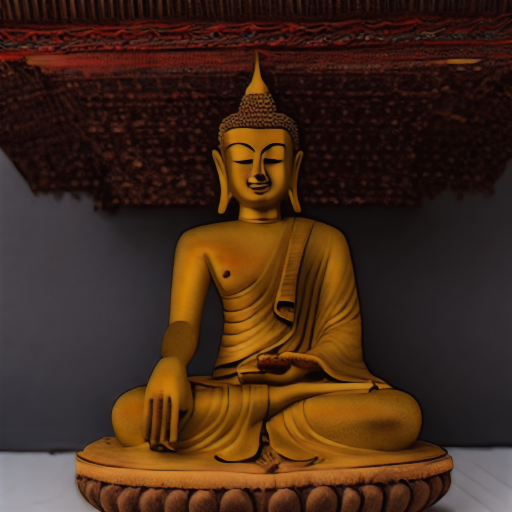

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

cv2_imshow(cv2.imread("/content/delight.png"))

# **4. Upscaling the image using GAN: Super-Resolution Generative Adversarial Networks (SRGANs)**

Super-Resolution Generative Adversarial Networks (SRGANs) are a class of deep learning models designed to enhance image resolution by transforming low-resolution inputs into high-resolution outputs with remarkable detail and quality. They leverage Generative Adversarial Networks (GANs), where two neural networks—the generator and the discriminator—compete in a game-theoretic framework to produce high-quality images.
The Role of Architecture in High-Quality Image Super-Resolution

The architecture of SRGANs plays a crucial role in achieving high-quality image super-resolution. Key architectural elements include:

  - Residual Blocks: These blocks help the network learn and refine image details by capturing the residuals (differences) between the input and output. This approach preserves fine textures and reduces artifacts commonly found in simpler models.
  
  - Upsampling Layers: Essential for increasing image resolution, these layers use techniques such as transposed convolution or sub-pixel convolution to upscale low-resolution images, ensuring improved quality.

  - Deep Convolutional Networks: The depth and complexity of convolutional layers enable SRGANs to learn intricate patterns and details. Deeper networks capture more sophisticated features, resulting in highly realistic images.

  - Loss Functions: A combination of adversarial and content loss functions ensures that the generator produces visually convincing images while maintaining the fidelity of the original content. Properly balancing these losses is crucial for achieving optimal image quality.

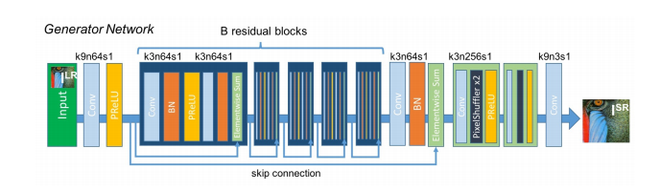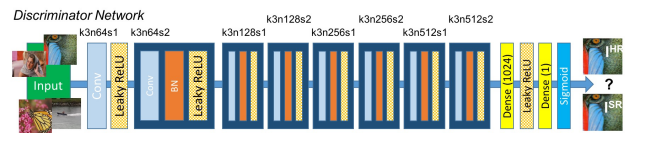

**Reference: [link](https://www.geeksforgeeks.org/architecture-of-super-resolution-generative-adversarial-networks-srgans/?ref=asr3)**

## **4.1. Import necessary library**

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

## **4.2. Configuration of GPU or CPU**

In [ ]:
# Force CPU execution
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

# Configure TensorFlow to use CPU only
physical_devices = tf.config.list_physical_devices('GPU')
try:
    # Disable all GPUs
    tf.config.set_visible_devices([], 'GPU')
    print("GPU disabled successfully")
except:
    print("No GPU found to disable")

# Verify we're running on CPU
print(f"TensorFlow is using GPU: {tf.test.is_gpu_available()}")
print(f"Devices visible to TensorFlow: {tf.config.list_physical_devices()}")

## **4.3. Prerequistic Functions**

In [ ]:
# Model to preprocess the images
def preprocessing(img):
    img_tensor = tf.convert_to_tensor(img)
    imageSize = (tf.convert_to_tensor(img.shape[:-1]) // 4) * 4
    cropped_image = tf.image.crop_to_bounding_box(
        img_tensor, 0, 0, imageSize[0], imageSize[1])
    preprocessed_image = tf.cast(cropped_image, tf.float32)
    return tf.expand_dims(preprocessed_image, 0)

# Model to employ the model
def srmodel(img):
    with tf.device('/CPU:0'):
        preprocessed_image = preprocessing(img)  # Preprocess the LR Image
        print(f"Running super-resolution on image of shape {img.shape}...")
        new_image = model(preprocessed_image)    # Runs the model
        # returns the size of the original argument that is given as input
        return tf.squeeze(new_image) / 255.0

# Create a simple super-resolution model
def simple_sr_model():
    inputs = layers.Input(shape=(None, None, 3))
    x = layers.UpSampling2D(size=4, interpolation='bilinear')(inputs)
    model = tf.keras.Model(inputs, x)
    return model

## **4.4. Main: SRGAN**

In [ ]:
# Loading the image
img = cv2.imread('delight.png')
if img is None:
    raise ValueError("Could not load the image. Check if the file exists and the path is correct.")

image_plot = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print("Attempting to load ESRGAN model with CPU only...")
try:
    with tf.device('/CPU:0'):
        # Load ESRGAN model on CPU explicitly
        esrgn_path = "https://tfhub.dev/captain-pool/esrgan-tf2/1"
        model = hub.load(esrgn_path)
        print("Model loaded successfully on CPU")

        # Generate HR image
        hr_image = srmodel(image_plot)

        # Convert to numpy array and save
        hr_image_np = hr_image.numpy()
        # Convert from [0,1] to [0,255] and change to BGR for OpenCV
        hr_image_cv2 = cv2.cvtColor((hr_image_np * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)

        # Save the upscaled image
        output_path = 'delight_upscaled.png'
        cv2.imwrite(output_path, hr_image_cv2)
        print(f"Upscaled image saved to {output_path}")

except Exception as e:
    print(f"Error during model loading or super-resolution: {str(e)}")

    # Let's try a different approach - let's see if we can use a different model
    print("\nAttempting alternative approach with a simpler super-resolution model...")
    try:
        import tensorflow.keras.layers as layers

        simple_model = simple_sr_model()

        # Process the image with simple model
        img_tensor = tf.convert_to_tensor(image_plot, dtype=tf.float32) / 255.0
        img_tensor = tf.expand_dims(img_tensor, 0)
        upscaled = simple_model(img_tensor)[0]

        # Save the result from simple model
        upscaled_np = (upscaled.numpy() * 255).astype(np.uint8)
        simple_output_path = 'delight_simple_upscaled.png'
        cv2.imwrite(simple_output_path, cv2.cvtColor(upscaled_np, cv2.COLOR_RGB2BGR))
        print(f"Simple upscaled image saved to {simple_output_path}")

    except Exception as e2:
        print(f"Error with alternative approach: {str(e2)}")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


No GPU found to disable
TensorFlow is using GPU: True
Devices visible to TensorFlow: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Attempting to load ESRGAN model with CPU only...
Model loaded successfully on CPU
Running super-resolution on image of shape (512, 512, 3)...
Upscaled image saved to delight_upscaled.png


## **4.5. Upscaling image shape and output visualization**

Input Image Resolution (512, 512, 3)
Upscaled Image Resolution (2048, 2048, 3)


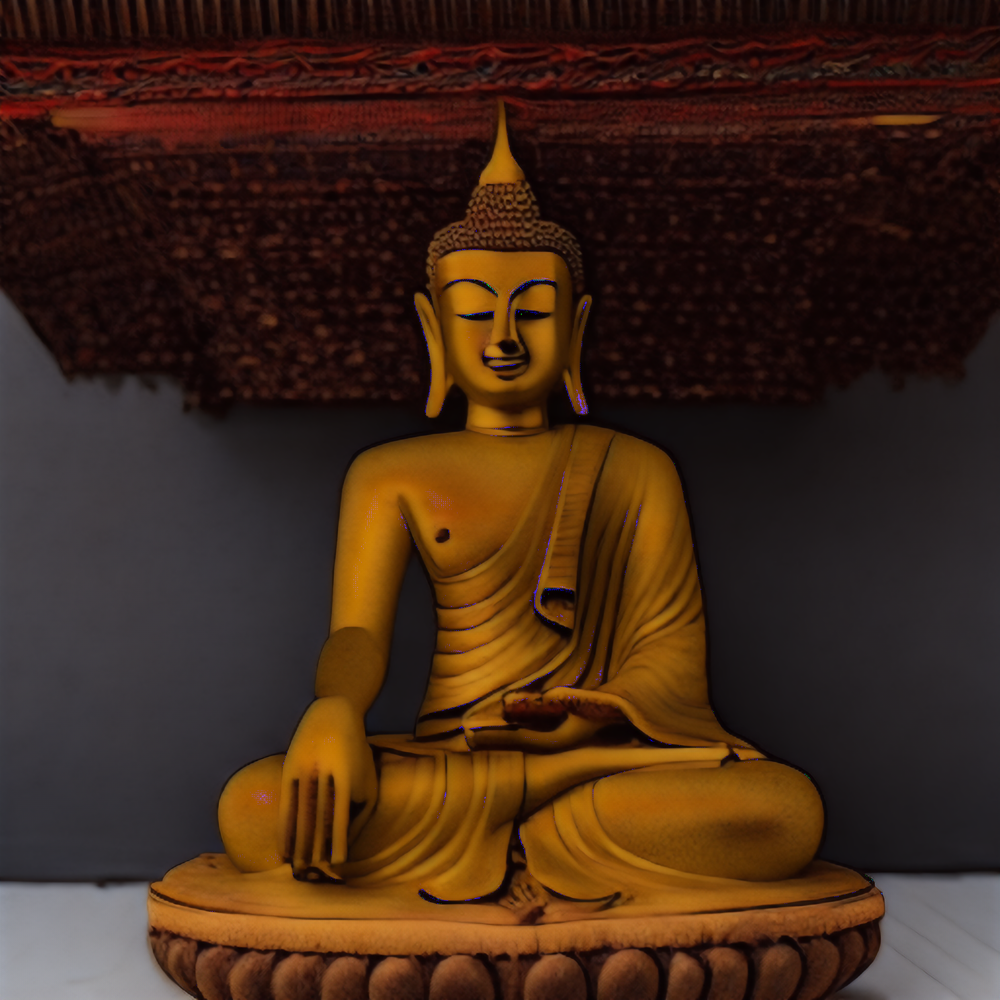

In [ ]:
from google.colab.patches import cv2_imshow

img_upscale = cv2.imread("/content/delight_upscaled.png")
print('Input Image Resolution', img.shape)
print('Upscaled Image Resolution', img_upscale.shape)
cv2_imshow(img_upscale)

# **5. Image to 3D reconstruction using TRIPOSR**



- TripoSR, a novel 3D reconstruction model utilizing transformer architecture to achieve rapid feed-forward 3D image generation introduced by Stability AI.

- TripoSR is capable of producing a 3D mesh from a single image in less than 0.5 seconds. Built upon the foundation of the Large reconstruction model (LRM) network architecture, TripoSR incorporates significant enhancements in data processing, model design, and training methodologies.

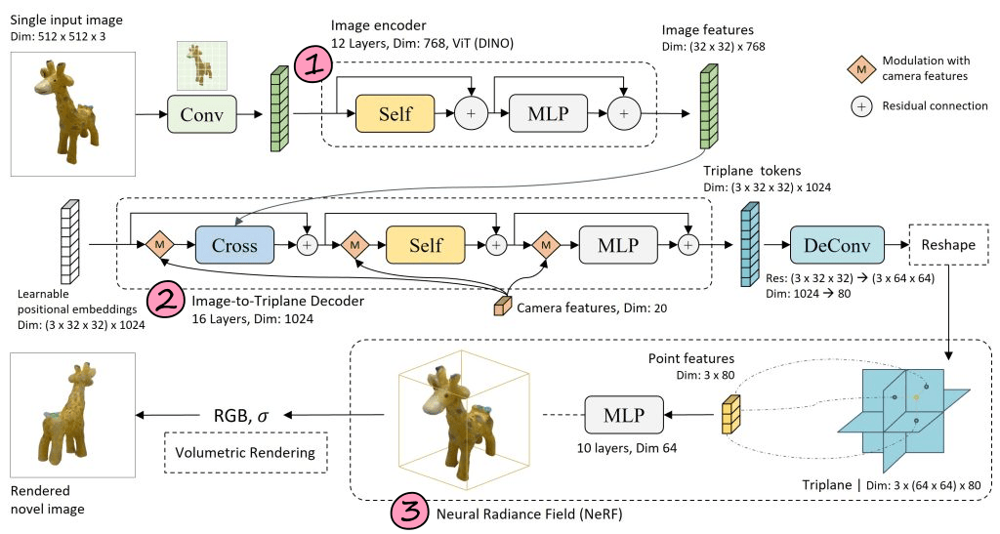

- TripoSR is a cutting-edge model for reconstructing 3D objects from single images. It builds upon the transformer architecture, enhanced with novel techniques. The design of TripoSR is based upon Large reconstruction model (LRM). By leveraging a pre-trained vision transformer (DINOv1) for encoding images, TripoSR captures both global and local features crucial for 3D reconstruction. Its decoder transforms these encoded features into a compact 3D representation, adept at handling complex shapes and textures. Notably, TripoSR doesn’t rely on explicit camera parameters, allowing it to adapt to various real-world scenarios without precise camera information. This flexibility enhances its robustness during both training and inference.

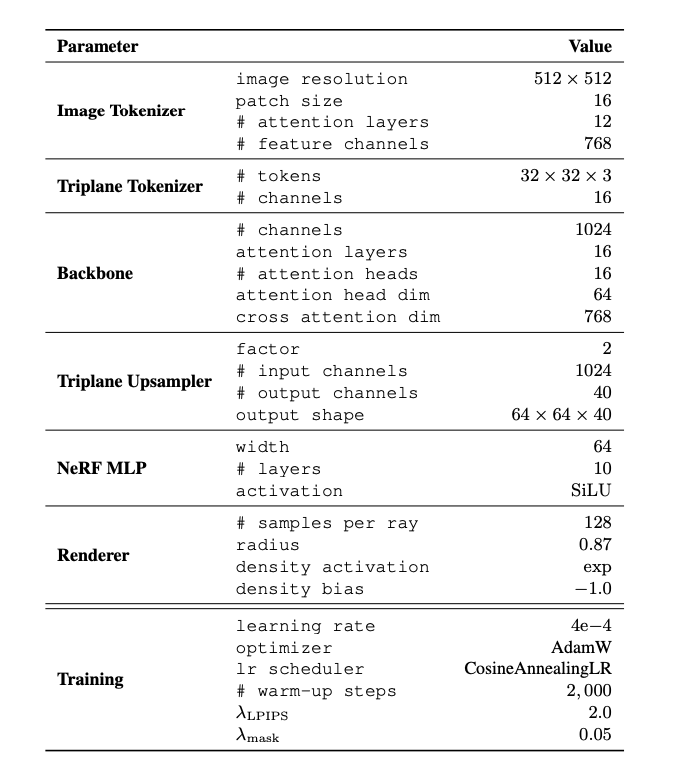

## **5.1. Install & Import Necessary library**

In [ ]:
!pip install trimesh pythreejs pygltflib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 707.4/707.4 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 68.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.7/271.7 kB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 68.1 MB/s eta 0:00:00
  Created wheel for pygltflib: filename=pygltflib-1.16.3-py3-none-any.whl size=27408 sha256=256d90830891f930ac34e22f5a2e85721b6b6c5f4b2244adbc760c75ccf60378
  Stored in directory: /root/.cache/pip/wheels/1e/75/a7/661db79759f1de86850bbbc3112020f4d18436bad637ea5673
Successfully built pygltflib


## **5.2. Run the inference**

**Notes: Model,Code stored in GDrive**

In [ ]:
%cd /content/drive/MyDrive/3dreconstruction/Image_3DReconstruction

/content/drive/MyDrive/3dreconstruction/Image_3DReconstruction


In [ ]:
!python RunTripoSR.py "/content/delight_upscaled.png" --output-dir "/content/"

2025-02-16 15:18:28,852 - INFO - Initializing model ...
/usr/local/lib/python3.11/dist-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.11/dist-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/usr/local/lib/python3.11/dist-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
2025-02-16 15:18:40,374 - INFO - Initializing model finished in 11522.23ms.
2025-02-16 15:18:40,374 - INFO - Processing images ...
2025-02-16 15:18:46,476 - INFO - Processing images finished 

## **5.3. Export the GLB and UV**

In [ ]:
import trimesh
import numpy as np
from PIL import Image
import os

def obj_to_glb_with_uv(obj_path, glb_path, save_uv_map=False, uv_map_path=None):
    # Load the OBJ file using trimesh
    mesh = trimesh.load(obj_path)

    # Check if the mesh has UV coordinates
    if hasattr(mesh.visual, 'uv') and mesh.visual.uv is not None:
        print(f"UV coordinates found in the mesh")
    else:
        print(f"No UV coordinates found in the mesh")

    # Export as GLB (UV coordinates are automatically preserved)
    mesh.export(glb_path, file_type='glb')

    if save_uv_map and hasattr(mesh.visual, 'uv') and mesh.visual.uv is not None:
        if uv_map_path is None:
            uv_map_path = os.path.splitext(glb_path)[0] + "_uv_map.png"

        # Get the UV coordinates
        uv_coords = mesh.visual.uv

        # Create a blank UV map image (white background)
        img_size = 1024
        uv_image = np.ones((img_size, img_size, 3), dtype=np.uint8) * 255

        # Draw UV points on the image
        for uv in uv_coords:
            x = int(uv[0] * (img_size-1))
            y = int((1-uv[1]) * (img_size-1))  # Flip Y since image origin is top-left

            # Ensure coordinates are within bounds
            x = max(0, min(x, img_size-1))
            y = max(0, min(y, img_size-1))

            # Draw a black pixel at UV coordinate
            uv_image[y, x] = [0, 0, 0]

        # Save the UV map image
        Image.fromarray(uv_image).save(uv_map_path)
        print(f"UV map saved to {uv_map_path}")

    print(f"Successfully converted {obj_path} to {glb_path}")


In [ ]:
obj_file = "/content/mesh.obj"
glb_file = "Output.glb"

# Convert and save UV map
obj_to_glb_with_uv(obj_file, glb_file, save_uv_map=True)

No UV coordinates found in the mesh
Successfully converted /content/mesh.obj to Output.glb


# **6. Final Output: Visualization of 3D Reconstruction output**

In [ ]:
import trimesh
# Provide the path to the .obj file
obj_file_path = '/content/0/mesh.obj'
# Load the .obj file
mesh = trimesh.load_mesh(obj_file_path)
# Display the 3D model
mesh.show()

# **Future Development**

- RL agent-based texture color tuning.
- Material detection with base color application – aiming for more realistic texture and detailed refinement.
- Develop a UV mapping model.

The main goal is to achieve high-quality text-to-3D reconstruction with lower computational cost compared to other approaches.

                                                     Thankyou